<font size=4>
    Jacob Nardone <br>
    netid: nardonej <br>
    sid#: 73508576 <br>
</font>

# <center> Final 3D Reconstruction Project </center>

In [1]:
# lets me reload certain modules every time I run a cell
%load_ext autoreload
# %aimport   # stores all the helper functions I write and use for the project
%aimport camutils
%aimport meshutils

import pickle
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from trimesh import Trimesh

%matplotlib inline

In [2]:
%autoreload

# Calibrate the extrinsic parameters of the left and right camera.
# Note: left and right camera are exactly the same for every grab


f = open('calibration.pickle', 'rb')
intrin = pickle.load(f)

focal = (intrin['fx'] + intrin['fy']) / 2 #average of the 2
offset = np.array([[intrin['cx'], intrin['cy']]]).T

# create Camera objects representing the left and right cameras
# use the known intrinsic parameters you loaded in.
camL = camutils.Camera(focal, offset, camutils.makerotation(0,0,0), np.array([[0,0,0]]).T)
camR = camutils.Camera(focal, offset, camutils.makerotation(0,0,0), np.array([[0,0,0]]).T)



# get the right camera extrinsics

imgR = plt.imread('./calib_jpg_u/frame_C0_01.jpg')

    
ret, cornersR = cv2.findChessboardCorners(imgR, (8,6), None)
pts2R = cornersR.squeeze().T



# get the left camera extrinsics

imgL = plt.imread('./calib_jpg_u/frame_C1_01.jpg')

ret, cornersL = cv2.findChessboardCorners(imgL, (8,6), None)
pts2L = cornersL.squeeze().T



# generate the known 3D point coordinates of points on the checkerboard in cm
pts3 = np.zeros((3,6*8))
yy,xx = np.meshgrid(np.arange(8),np.arange(6))
pts3[0,:] = 2.8*xx.reshape(1,-1)
pts3[1,:] = 2.8*yy.reshape(1,-1)


# Now use your calibratePose function to get the extrinsic parameters
# for the two images. You may need to experiment with the initialization
# in order to get a good result

init_params = np.array([0,0,0,0,0,-5])

camL = camutils.calibratePose(pts3, pts2L, camL, init_params)
camR = camutils.calibratePose(pts3, pts2R, camR, init_params)

print(camL)
print(camR)

Camera : 
 f=1404.6009650962417 
 c=[[962.16736421 590.91595766]] 
 R=[[-0.00259869  0.99096867  0.13406842]
 [ 0.99277873 -0.01352254  0.11919539]
 [ 0.11993185  0.13341003 -0.98377747]] 
 t = [[ 7.5001128   7.20925351 47.7649522 ]]
Camera : 
 f=1404.6009650962417 
 c=[[962.16736421 590.91595766]] 
 R=[[ 0.03843674  0.98947412  0.13951197]
 [ 0.97735772 -0.00815435 -0.21143652]
 [-0.20807334  0.14448003 -0.96738359]] 
 t = [[ 6.86588629 19.52346809 47.34419226]]


loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )



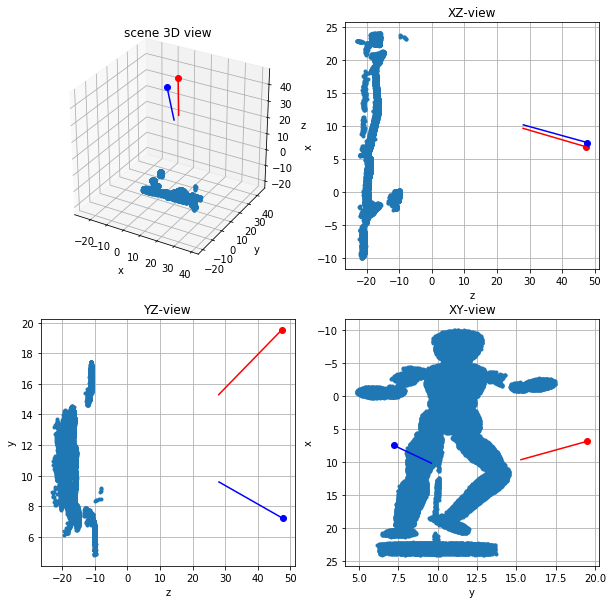

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )



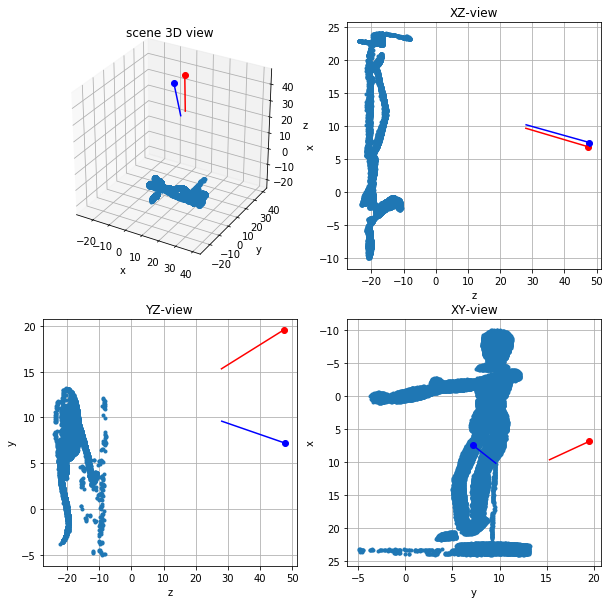

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )



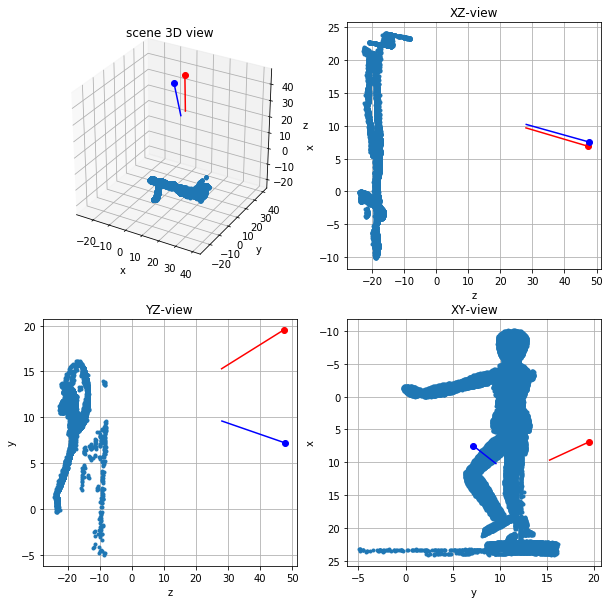

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )



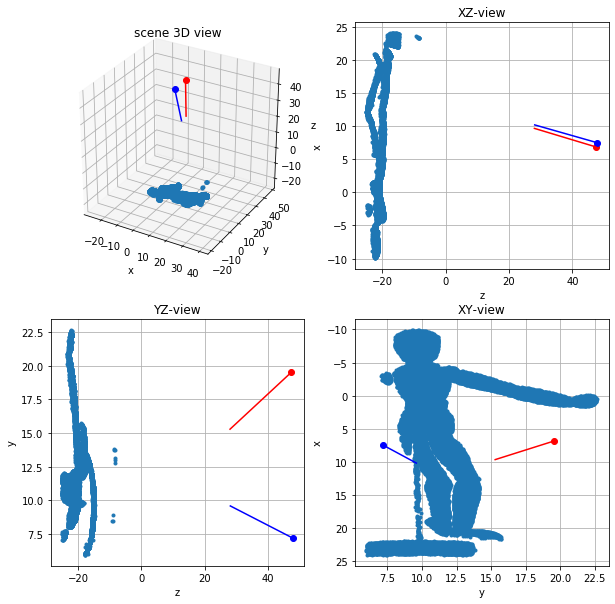

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )

loading( 0 1 )( 2 3 )( 4 5 )( 6 7 )( 8 9 )( 10 11 )( 12 13 )( 14 15 )( 16 17 )( 18 19 )

loading( 20 21 )( 22 23 )( 24 25 )( 26 27 )( 28 29 )( 30 31 )( 32 33 )( 34 35 )( 36 37 )( 38 39 )



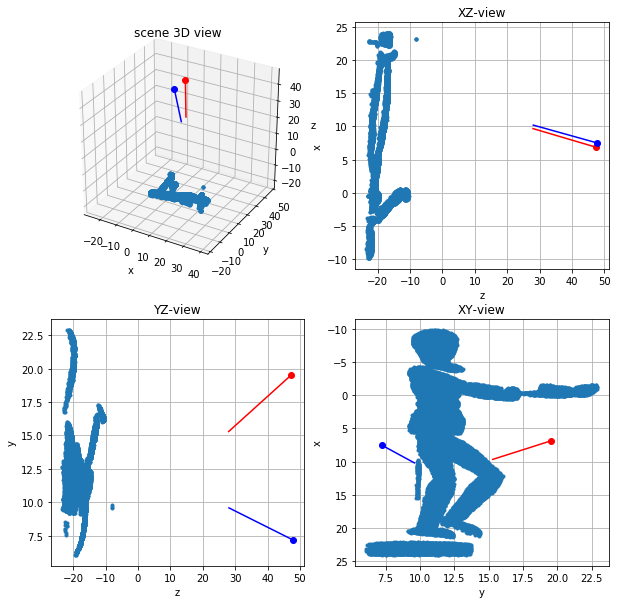

In [3]:
%autoreload
plt.rcParams['figure.figsize']=[10,10]

# thresholds for each grab set.
ct = 0.017
tt = 1

resultfile = "all_meshes.pickle"
fid = open(resultfile, "wb")
NGRAB = len(os.listdir("./manny")) # get the number of grabs
for x in range(NGRAB):
    imprefixL = f"./manny/grab_{x}_u/frame_C1_" # LEFT camera
    imprefixR = f"./manny/grab_{x}_u/frame_C0_" # RIGHT camera
    meshutils.create_mesh(imprefixL, imprefixR, camL, camR, ct, tt, x, fid)
fid.close()

In [7]:
%autoreload

fid = open(resultfile, 'rb') # Open the pickle file that stores all the meshes
all_meshes = []

for x in range(NGRAB):
    mesh_data = pickle.load(fid)
    p3,tri,colors = mesh_data.values()
    p3 = meshutils.smooth_mesh(p3, tri, repeat=5)
    mesh = Trimesh(vertices=p3.T, faces=tri[:,[0,2,1]])
    all_meshes.append(mesh) # for later viewing in the notebook
    meshutils.writeply(p3, colors, tri, 'mesh' + str(x+1) + '.ply')

fid.close()

In [5]:
all_meshes[0].show()

In [8]:
all_meshes[1].show()

In [9]:
all_meshes[2].show()

In [10]:
all_meshes[3].show()

In [11]:
all_meshes[4].show()